**Hard Sample Mining (HSM) with latent code optimization, Dataset Smoothing and Batch Norm statistics Adaptation (BNA)**

In [7]:
import os
import pandas as pd
import numpy as np
from PIL import Image
import matplotlib.pyplot as plt
import torch
import torch.nn as nn
import torch.nn.functional as F
from torchvision import models, transforms, datasets
from torch.utils.data import DataLoader, Dataset, random_split

Classes: ['n07747607', 'n02128757', 'n04467665', 'n04285008', 'n02056570', 'n03095699', 'n02692877', 'n04254680', 'n02690373', 'n02085936']

Class: n07747607, Number of images: 5


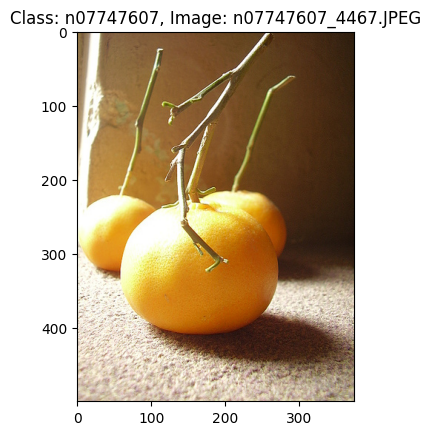

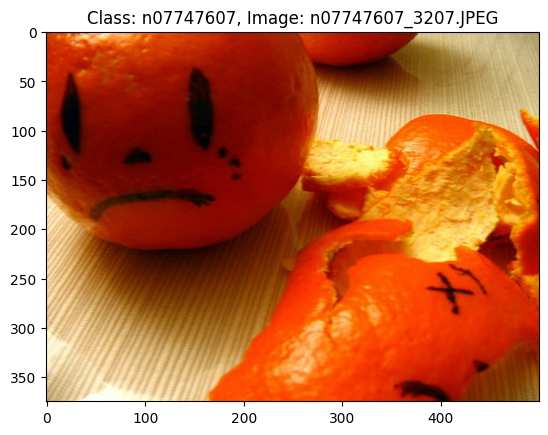

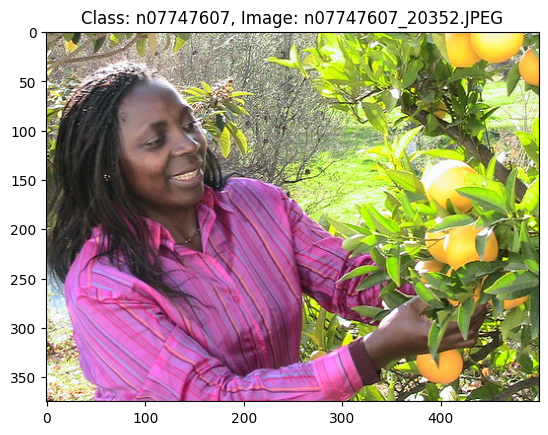

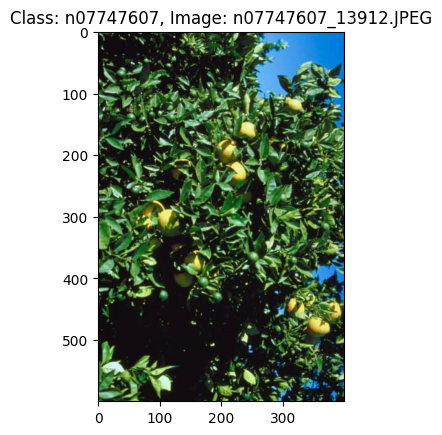

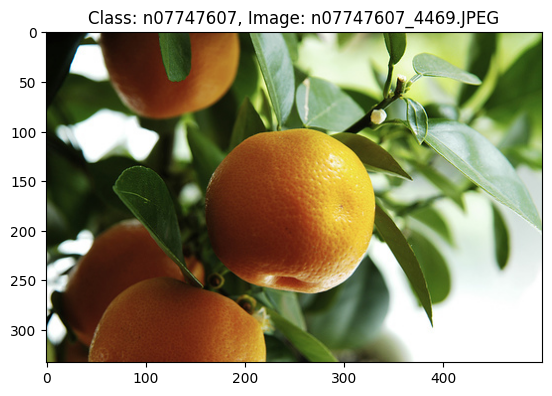


Class: n02128757, Number of images: 5


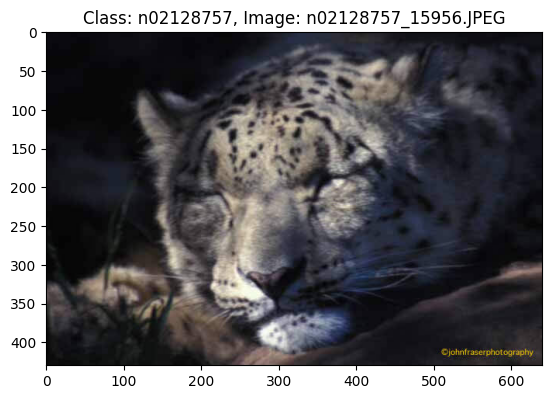

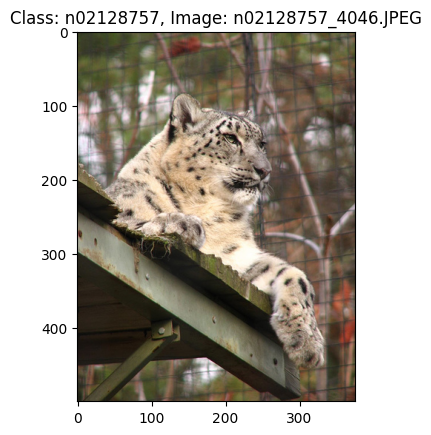

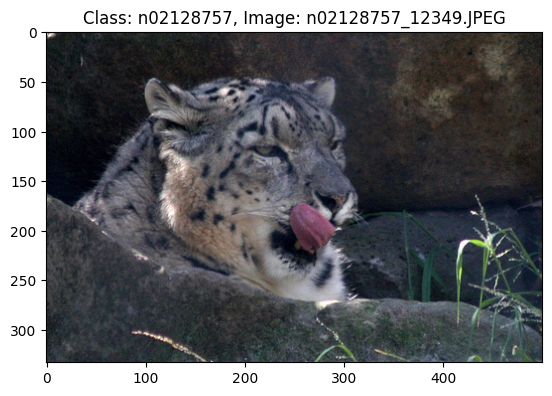

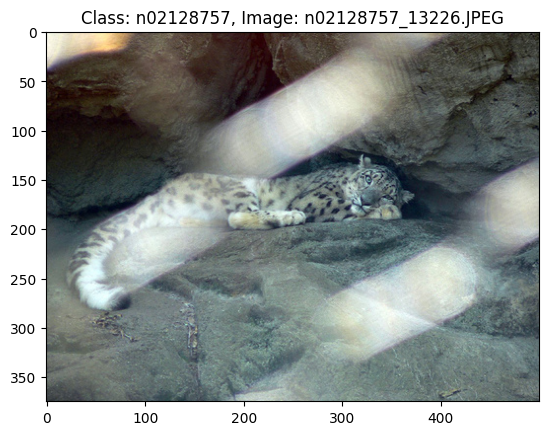

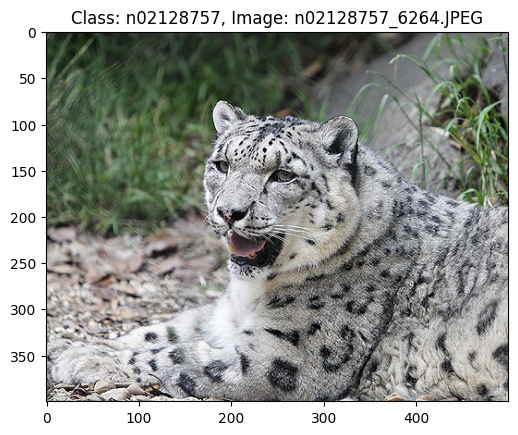


Class: n04467665, Number of images: 5


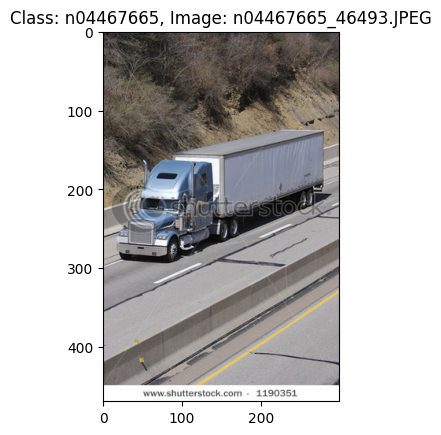

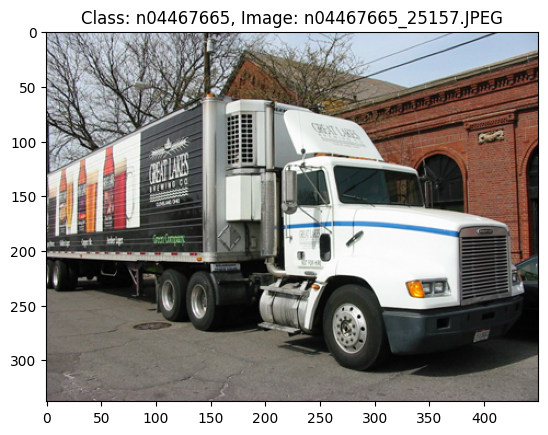

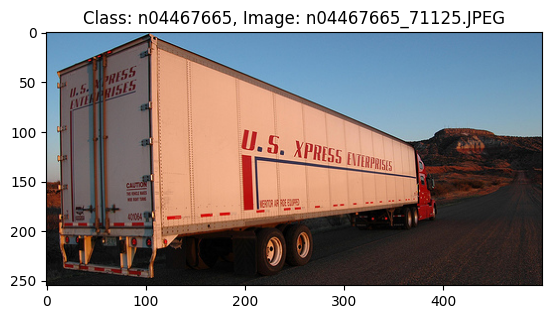

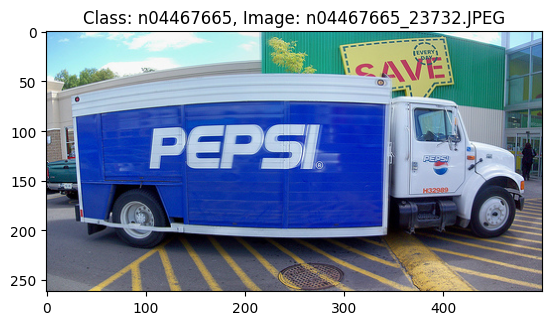

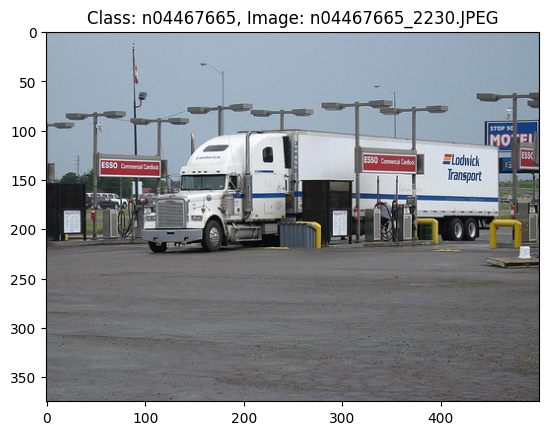


Class: n04285008, Number of images: 5


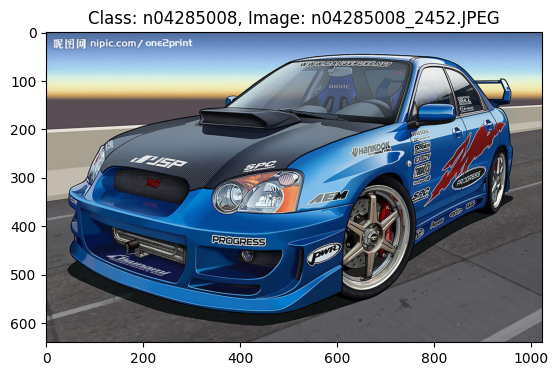

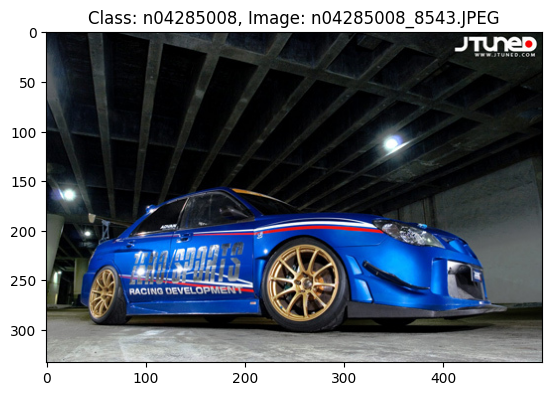

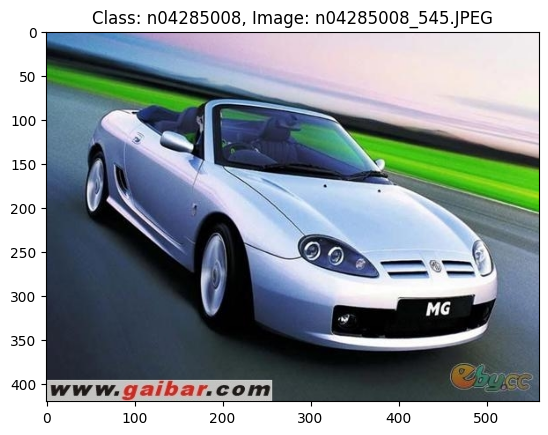

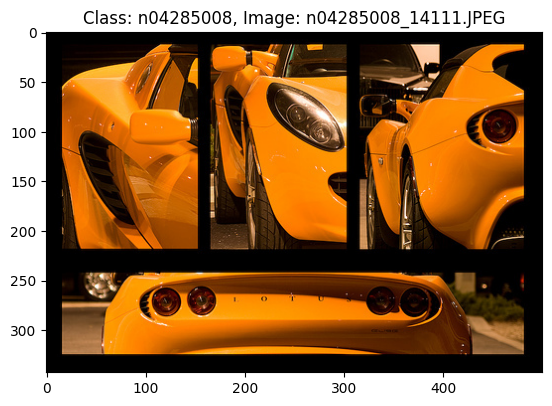

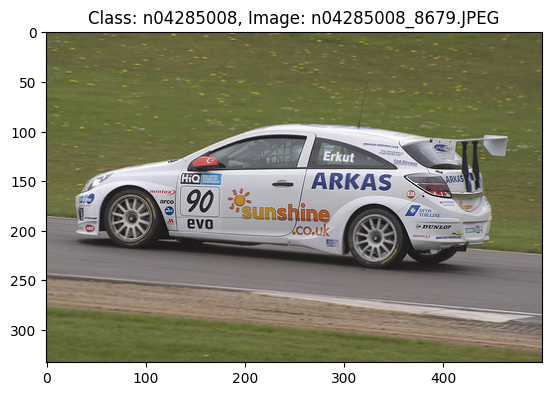


Class: n02056570, Number of images: 5


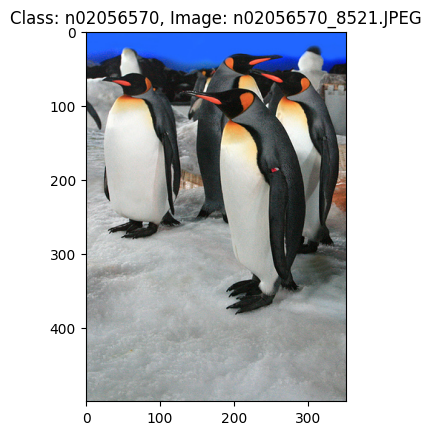

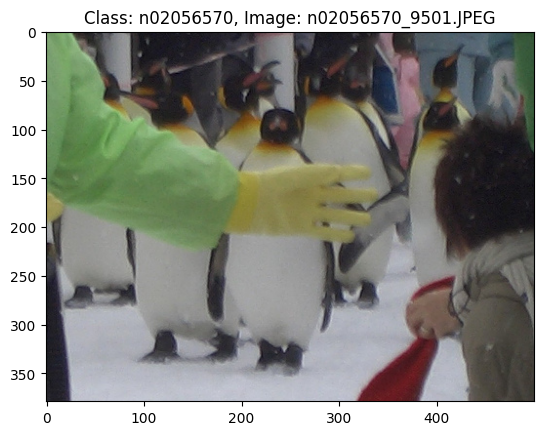

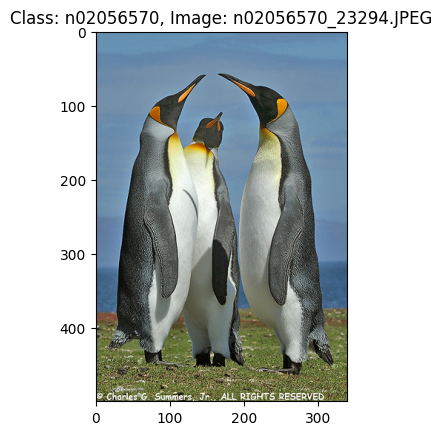

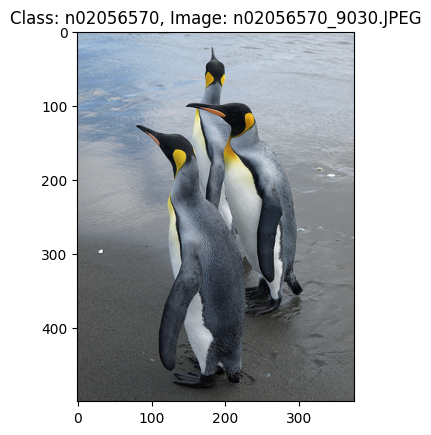

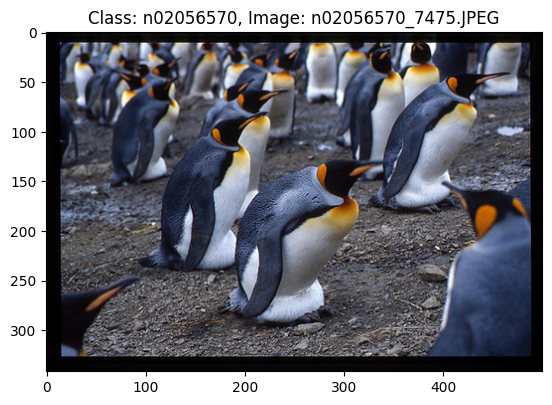


Class: n03095699, Number of images: 5


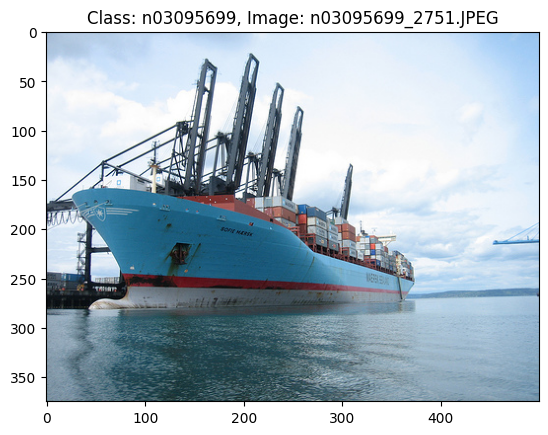

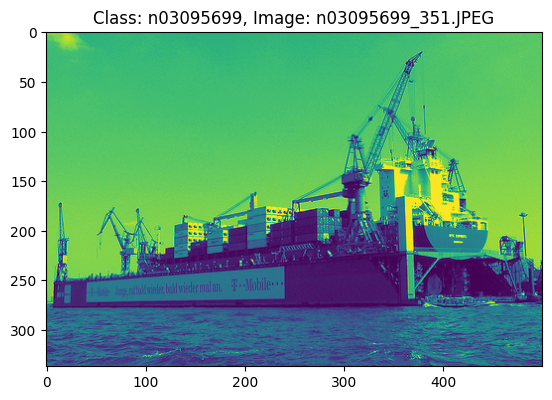

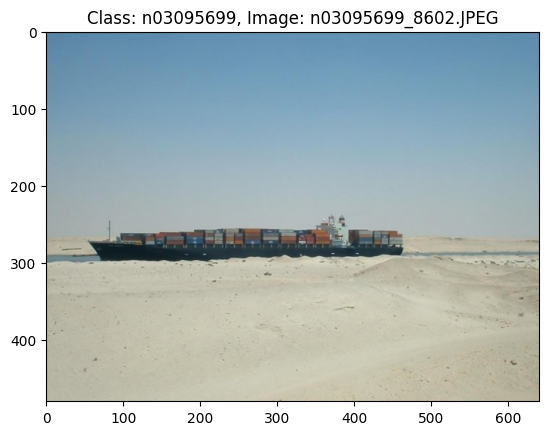

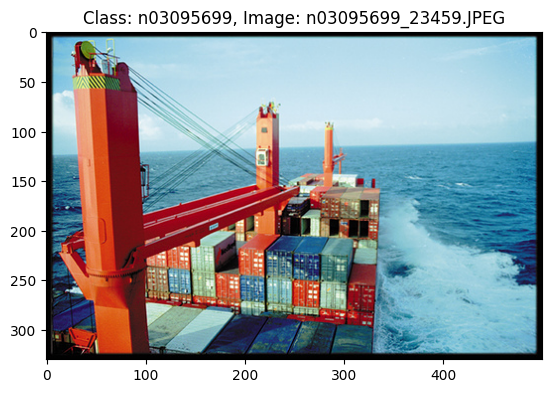

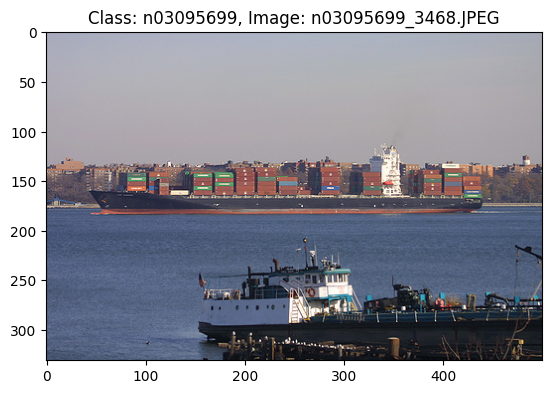


Class: n02692877, Number of images: 5


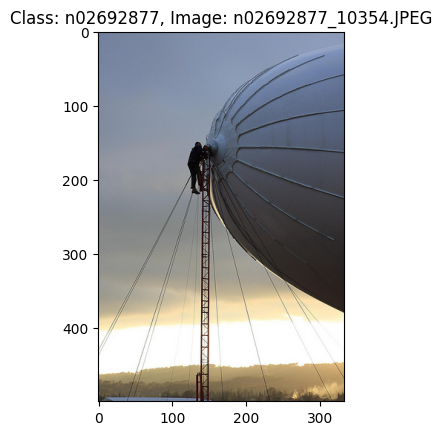

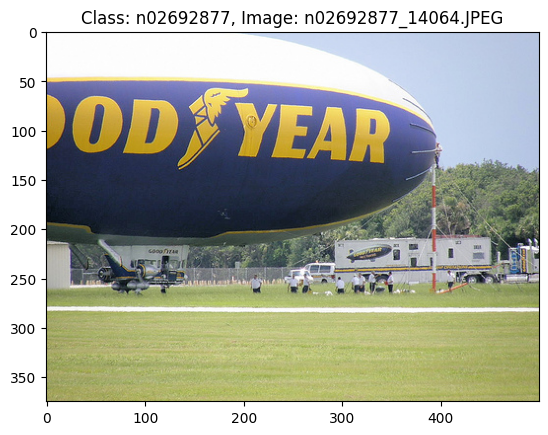

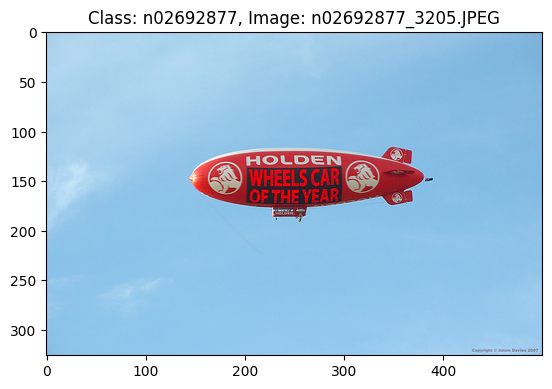

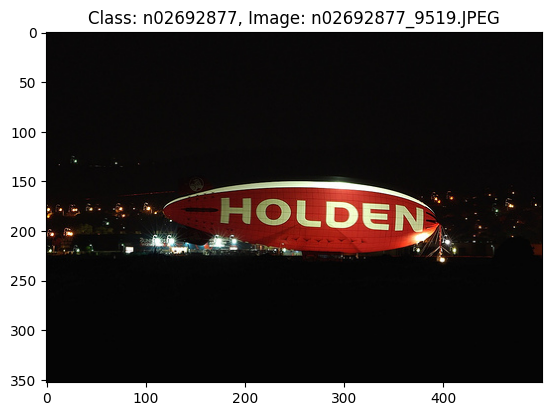

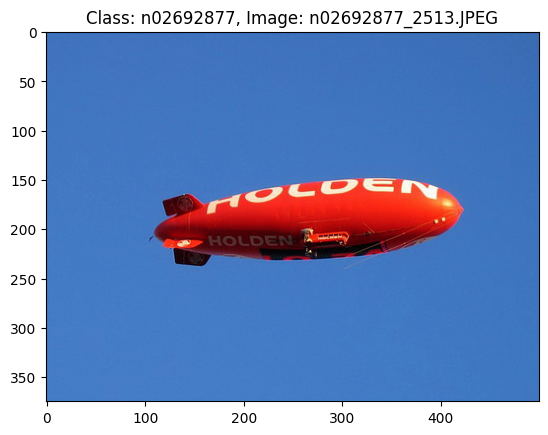


Class: n04254680, Number of images: 5


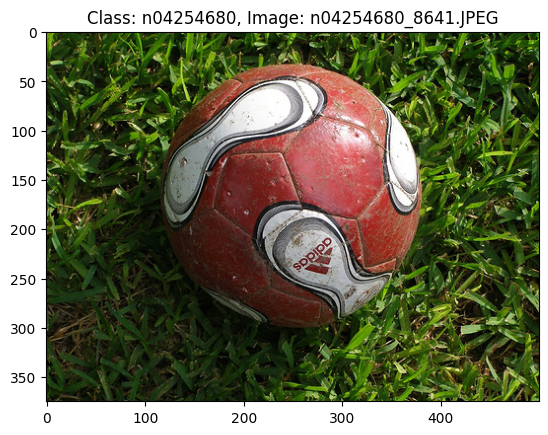

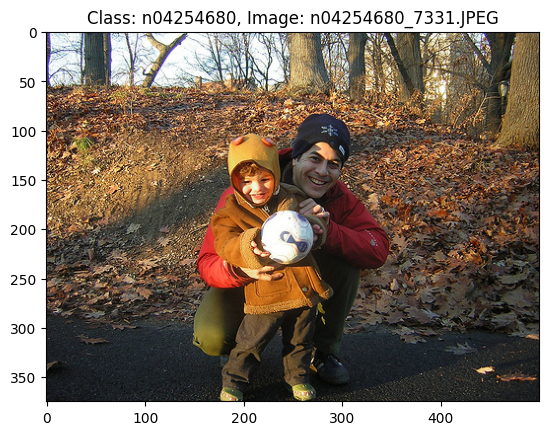

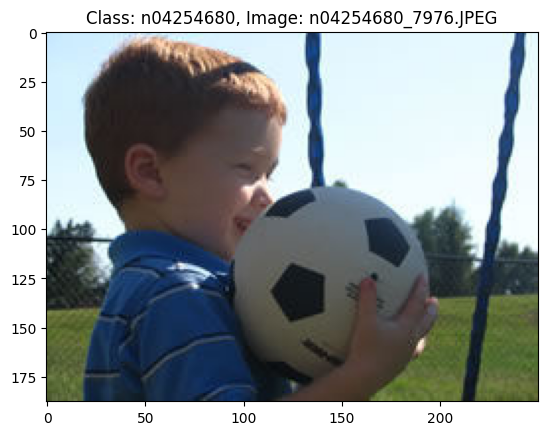

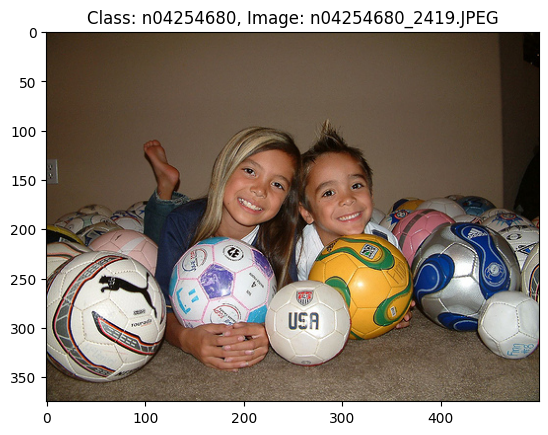

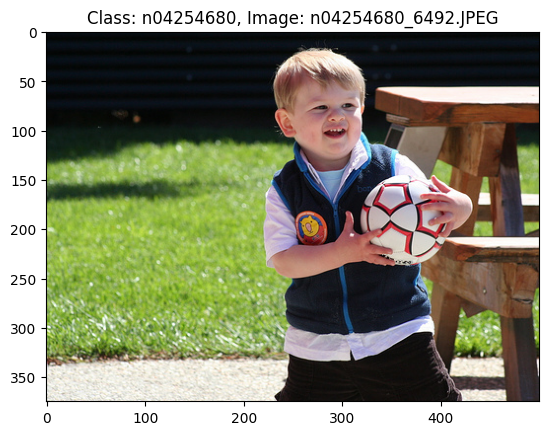


Class: n02690373, Number of images: 5


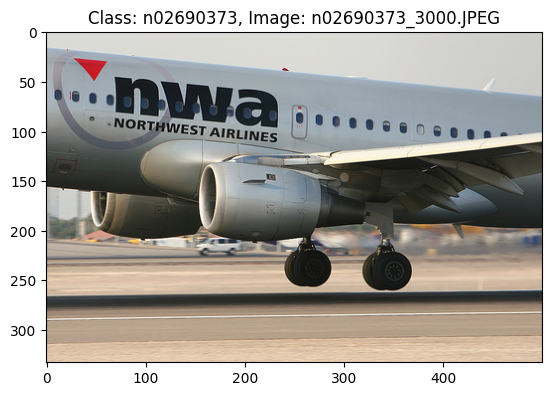

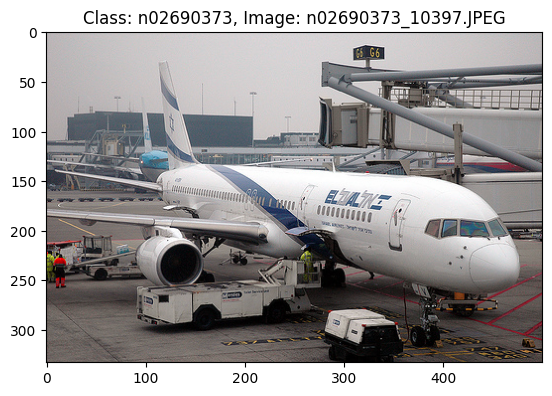

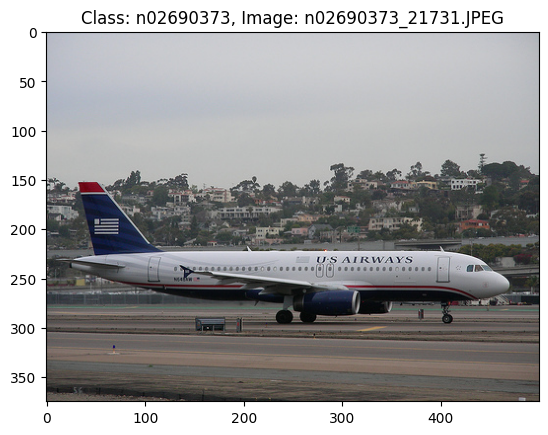

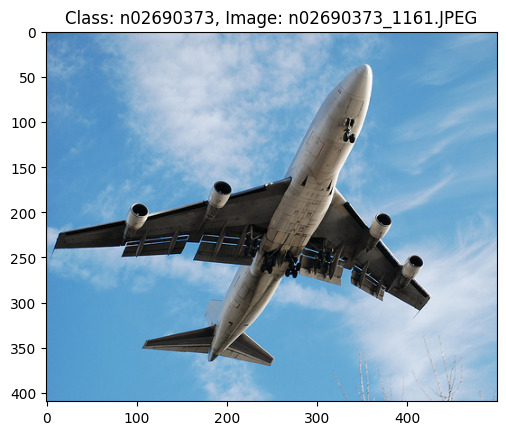

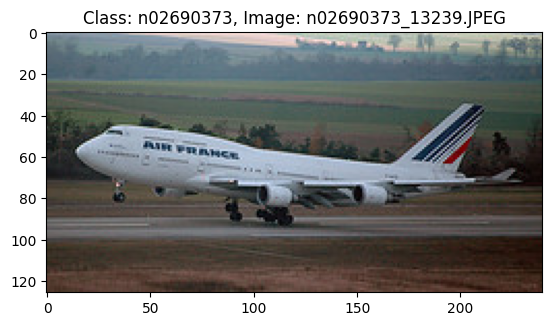


Class: n02085936, Number of images: 5


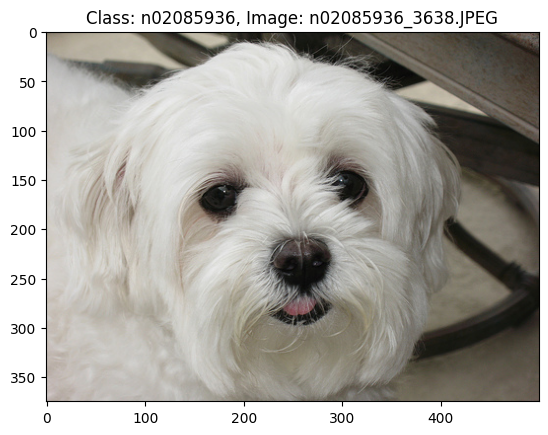

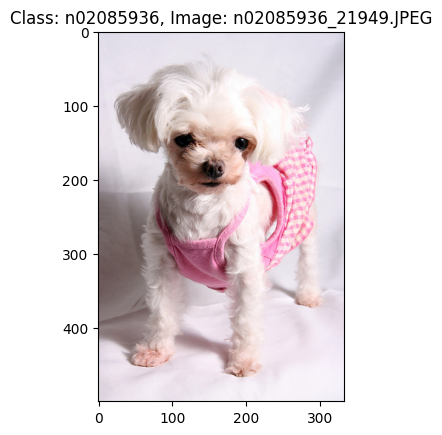

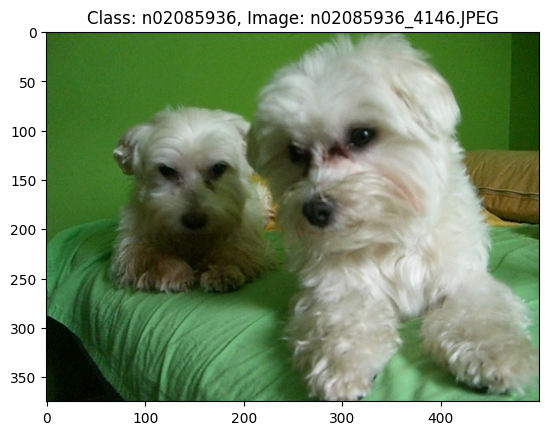

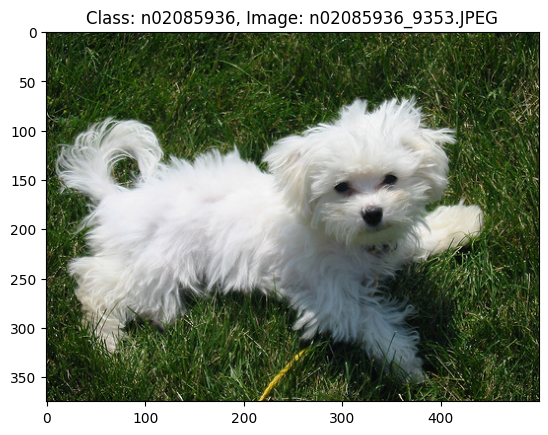

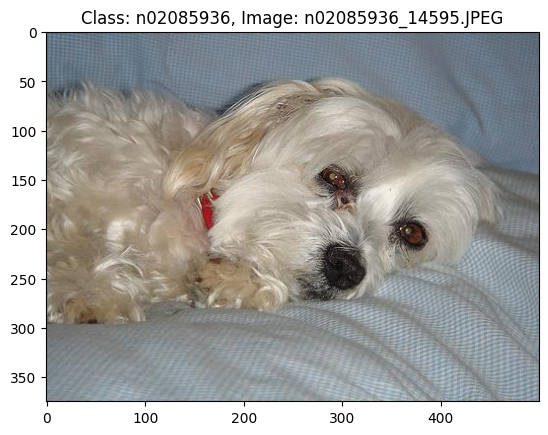

2024-07-04 22:12:29.422960: I external/local_tsl/tsl/cuda/cudart_stub.cc:32] Could not find cuda drivers on your machine, GPU will not be used.
2024-07-04 22:12:29.426210: I external/local_tsl/tsl/cuda/cudart_stub.cc:32] Could not find cuda drivers on your machine, GPU will not be used.
2024-07-04 22:12:29.435621: E external/local_xla/xla/stream_executor/cuda/cuda_fft.cc:479] Unable to register cuFFT factory: Attempting to register factory for plugin cuFFT when one has already been registered
2024-07-04 22:12:29.466017: E external/local_xla/xla/stream_executor/cuda/cuda_dnn.cc:10575] Unable to register cuDNN factory: Attempting to register factory for plugin cuDNN when one has already been registered
2024-07-04 22:12:29.466065: E external/local_xla/xla/stream_executor/cuda/cuda_blas.cc:1442] Unable to register cuBLAS factory: Attempting to register factory for plugin cuBLAS when one has already been registered
2024-07-04 22:12:29.486521: I tensorflow/core/platform/cpu_feature_guard.cc:

Found 9007 images belonging to 10 classes.
Found 2249 images belonging to 10 classes.


In [4]:
# Base directory of the dataset
base_dir = '/home/project/Synthetic_Learning/data/imagenet-10'

# List all subdirectories (assuming each subdirectory is a class)
classes = os.listdir(base_dir)
print("Classes:", classes)

# Load a few images from each class and display them
for class_name in classes:
    class_dir = os.path.join(base_dir, class_name)
    if os.path.isdir(class_dir):
        # List a few image files in the class directory
        image_files = os.listdir(class_dir)[:5]  # Load the first 5 images
        print(f"\nClass: {class_name}, Number of images: {len(image_files)}")
        
        for image_file in image_files:
            image_path = os.path.join(class_dir, image_file)
            # Load the image
            image = Image.open(image_path)
            # Display the image
            plt.imshow(image)
            plt.title(f"Class: {class_name}, Image: {image_file}")
            plt.show()

# Optionally, you can load images into arrays for further processing
from tensorflow.keras.preprocessing.image import ImageDataGenerator

# Create an ImageDataGenerator for loading and preprocessing the images
datagen = ImageDataGenerator(rescale=1.0/255.0, validation_split=0.2)  # Rescale pixel values to [0, 1]

# Create a generator for the training set
train_generator = datagen.flow_from_directory(
    base_dir,
    target_size=(224, 224),  # Resize images to 224x224 pixels
    batch_size=32,
    class_mode='categorical',
    subset='training'
)

# Create a generator for the validation set
validation_generator = datagen.flow_from_directory(
    base_dir,
    target_size=(224, 224),
    batch_size=32,
    class_mode='categorical',
    subset='validation'
)

In [5]:
import os
import torch

# Clone the repository
!git clone https://github.com/huggingface/pytorch-pretrained-BigGAN.git

# Install the repository
!pip install ./pytorch-pretrained-BigGAN

/home/project/anaconda3/envs/to113/lib/python3.10/site-packages/tqdm/auto.py:21: TqdmWarning: IProgress not found. Please update jupyter and ipywidgets. See https://ipywidgets.readthedocs.io/en/stable/user_install.html
  from .autonotebook import tqdm as notebook_tqdm


Cloning into 'pytorch-pretrained-BigGAN'...
remote: Enumerating objects: 71, done.
remote: Total 71 (delta 0), reused 0 (delta 0), pack-reused 71
Unpacking objects: 100% (71/71), 334.64 KiB | 3.52 MiB/s, done.
Processing ./pytorch-pretrained-BigGAN
  Preparing metadata (setup.py) ... done
  Using cached jmespath-1.0.1-py3-none-any.whl.metadata (7.6 kB)
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 139.2/139.2 kB 239.8 kB/s eta 0:00:00a 0:00:01
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 12.4/12.4 MB 9.7 MB/s eta 0:00:00:00:010:01m
Using cached jmespath-1.0.1-py3-none-any.whl (20 kB)
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 82.7/82.7 kB 2.3 MB/s eta 0:00:00
  Created wheel for pytorch_pretrained_biggan: filename=pytorch_pretrained_biggan-0.1.0-py3-none-any.whl size=27322 sha256=99c9a29d003e7ccce2324c599aeeea30c5448ce432ec3907bdd7c54dff598619
  Stored in directory: /home/project/.cache/pip/wheels/32/80/e8/10e86d818aae69d82d5ea3bae9262da2b45a4202239b9368da
Successfully built pytorch_pretr

In [13]:
pip install nltk

  Using cached regex-2024.5.15-cp310-cp310-manylinux_2_17_x86_64.manylinux2014_x86_64.whl.metadata (40 kB)
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 1.5/1.5 MB 9.0 MB/s eta 0:00:00:00:010:01
Using cached regex-2024.5.15-cp310-cp310-manylinux_2_17_x86_64.manylinux2014_x86_64.whl (775 kB)
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 301.8/301.8 kB 18.4 MB/s eta 0:00:00
Note: you may need to restart the kernel to use updated packages.


In [16]:
import nltk
nltk_data_dir = '/home/project/Synthetic_Learning/data/nltk_data'
nltk.data.path.append(nltk_data_dir)
nltk.download('wordnet', download_dir=nltk_data_dir)
nltk.download('omw-1.4', download_dir=nltk_data_dir)

[nltk_data] Downloading package wordnet to
[nltk_data]     /home/project/Synthetic_Learning/data/nltk_data...
[nltk_data]   Package wordnet is already up-to-date!
[nltk_data] Downloading package omw-1.4 to
[nltk_data]     /home/project/Synthetic_Learning/data/nltk_data...
[nltk_data]   Package omw-1.4 is already up-to-date!


True

In [15]:
!unzip /usr/share/nltk_data/corpora/wordnet.zip -d /usr/share/nltk_data/corpora/

unzip:  cannot find or open /usr/share/nltk_data/corpora/wordnet.zip, /usr/share/nltk_data/corpora/wordnet.zip.zip or /usr/share/nltk_data/corpora/wordnet.zip.ZIP.


In [40]:
# Specify the GPU device
os.environ["CUDA_VISIBLE_DEVICES"] = '2'

# Check if CUDA is available and set the device
device = torch.device('cuda' if torch.cuda.is_available() else 'cpu')

print(f"Using device: {device}")
print(f"Current CUDA device: {torch.cuda.current_device()}")
if device.type == 'cuda':
    print(f"Using GPU: {torch.cuda.get_device_name(device)}")
os.makedirs("images", exist_ok=True)

Using device: cuda
Current CUDA device: 0
Using GPU: Quadro RTX 5000


**Custom Dataset class to handle image loading and transformations**

In [42]:
from pytorch_pretrained_biggan import BigGAN, truncated_noise_sample, one_hot_from_names

class CustomDataset(Dataset):
    def __init__(self, image_paths, class_labels, transform=None):
        self.image_paths = image_paths
        self.class_labels = class_labels
        self.transform = transform

    def __len__(self):
        return len(self.image_paths)

    def __getitem__(self, idx):
        image_path = self.image_paths[idx]
        image = Image.open(image_path).convert('RGB')
        label = self.class_labels[idx]
        if self.transform:
            image = self.transform(image)
        return image, label


**Function to generate new images**

In [ ]:

def generate_images(model, class_name, num_images, truncation):
    class_vector = one_hot_from_names([class_name] * num_images, batch_size=num_images)
    noise_vector = truncated_noise_sample(truncation=truncation, batch_size=num_images)
    
    noise_vector = torch.from_numpy(noise_vector)
    class_vector = torch.from_numpy(class_vector)
    
    # If you have a GPU, put everything on cuda
    device = torch.device('cuda' if torch.cuda.is_available() else 'cpu')
    noise_vector = noise_vector.to(device)
    class_vector = class_vector.to(device)
    model.to(device)
    
    # Generate images
    with torch.no_grad():
        output = model(noise_vector, class_vector, truncation)
    
    return output.to('cpu')

def save_images(images, class_name, output_dir):
    if not os.path.exists(output_dir):
        os.makedirs(output_dir)
    
    image_paths = []
    for i, image in enumerate(images):
        image_array = image.permute(1, 2, 0).numpy()  # Change dimensions to HWC for saving
        image_array = ((image_array + 1) / 2 * 255).astype(np.uint8)  # Scale to [0, 255]
        image_pil = Image.fromarray(image_array)
        image_path = os.path.join(output_dir, f"{class_name}_{i+1}.png")
        image_pil.save(image_path)
        image_paths.append(image_path)
    
    return image_paths

**Function to initialize the dataset with generated images**

In [ ]:

def initialize_dataset(generator, class_names, num_images_per_class, output_dir):
    all_image_paths = []
    all_class_labels = []
    for class_idx, class_name in enumerate(class_names):
        images = generate_images(generator, class_name, num_images_per_class, truncation=0.4)
        image_paths = save_images(images, class_name, output_dir)
        all_image_paths.extend(image_paths)
        all_class_labels.extend([class_idx] * num_images_per_class)
    return all_image_paths, all_class_labels

**Function to identify hard samples**

In [ ]:

def identify_hard_samples(dataloader, model, threshold=0.6):
    model.eval()
    hard_samples = []
    hard_sample_paths = []
    hard_sample_labels = []
    
    with torch.no_grad():
        for inputs, labels, paths in dataloader:
            inputs = inputs.to('cuda')
            outputs = model(inputs)
            probabilities = F.softmax(outputs, dim=1)
            max_probs, preds = torch.max(probabilities, dim=1)
            
            for i, (prob, label, path) in enumerate(zip(max_probs, labels, paths)):
                if prob < threshold:
                    hard_samples.append(inputs[i].cpu())
                    hard_sample_paths.append(path)
                    hard_sample_labels.append(label)
    
    return hard_samples, hard_sample_paths, hard_sample_labels, len(hard_samples)

**Function to update the dataset and Batch Norm statistics**

In [ ]:

def update_dataset(generator, dataset, class_names, fraction, output_dir):
    num_images_to_replace = int(len(dataset) * fraction)
    indices_to_replace = np.random.choice(len(dataset), num_images_to_replace, replace=False)
    
    new_image_paths = []
    new_class_labels = []
    for class_idx, class_name in enumerate(class_names):
        new_images = generate_images(generator, class_name, num_images_to_replace // len(class_names), truncation=0.4)
        new_image_paths.extend(save_images(new_images, class_name, output_dir))
        new_class_labels.extend([class_idx] * (num_images_to_replace // len(class_names)))
    
    for idx, (new_path, new_label) in zip(indices_to_replace, zip(new_image_paths, new_class_labels)):
        dataset.image_paths[idx] = new_path
        dataset.class_labels[idx] = new_label

def update_bn_statistics(model, dataloader):
    model.train()
    with torch.no_grad():
        for inputs, _ in dataloader:
            inputs = inputs.to('cuda')
            _ = model(inputs)  # Forward pass to update BN stats

**Training function with Dataset Smoothing**

In [ ]:

def train_model_with_ds(model, generator, dataset, class_names, criterion, optimizer, num_epochs=25, fraction=0.1):
    model.train()
    dataloader = DataLoader(dataset, batch_size=32, shuffle=True, collate_fn=lambda x: (torch.stack([i[0] for i in x]), [i[1] for i in x]))
    
    for epoch in range(num_epochs):
        running_loss = 0.0
        
        for inputs, labels in dataloader:
            inputs = inputs.to('cuda')
            labels = torch.tensor(labels).to('cuda')
            
            optimizer.zero_grad()
            outputs = model(inputs)
            loss = criterion(outputs, labels)
            loss.backward()
            optimizer.step()
            
            running_loss += loss.item() * inputs.size(0)
        
        epoch_loss = running_loss / len(dataloader.dataset)
        print(f"Epoch {epoch+1}/{num_epochs}, Loss: {epoch_loss:.4f}")
        
        # Replace a fraction of the dataset with new images
        update_dataset(generator, dataset, class_names, fraction, 'generated_images')
        
        # Update BN statistics at the end of each epoch
        update_bn_statistics(model, dataloader)
    
    return model

**Evaluation function to calculate Top-1 accuracy**

In [ ]:

def evaluate_model(model, dataloader):
    model.eval()
    correct = 0
    total = 0
    
    with torch.no_grad():
        for inputs, labels in dataloader:
            inputs, labels = inputs.to('cuda'), labels.to('cuda')
            outputs = model(inputs)
            _, preds = torch.max(outputs, 1)
            correct += (preds == labels).sum().item()
            total += labels.size(0)
    
    accuracy = correct / total
    return accuracy

**Main function to execute the dataset smoothing and model training**

In [27]:

def main():
    # Set parameters
    output_dir = 'generated_images3'
    initial_samples_per_class = 125  # Initial number of samples per class (M)
    total_samples_per_class = 1300  # Total number of samples per class (N)
    class_names = ['penguin', 'maltese_dog', 'snow_leopard', 'airliner', 'airship', 'container_ship', 'soccer_ball', 'sports_car', 'trailer_truck', 'orange']

    # Load pre-trained BigGAN model
    biggan_model = BigGAN.from_pretrained('biggan-deep-128').eval().to('cuda')

    # Initialize the dataset with initial samples
    initial_image_paths, initial_class_labels = initialize_dataset(biggan_model, class_names, initial_samples_per_class, output_dir)
    dataset = CustomDataset(initial_image_paths, initial_class_labels, transform=transforms.Compose([
        transforms.Resize((128, 128)),
        transforms.ToTensor(),
        transforms.Normalize(mean=[0.5, 0.5, 0.5], std=[0.5, 0.5, 0.5])
    ]))

    # Initialize the model
    model = models.resnet18(pretrained=False)
    num_ftrs = model.fc.in_features
    model.fc = nn.Linear(num_ftrs, len(class_names))  # Adjust the output layer for the number of classes
    model = model.to('cuda')

    criterion = nn.CrossEntropyLoss()
    optimizer = torch.optim.SGD(model.parameters(), lr=0.1, momentum=0.9, weight_decay=1e-4)

    # Collect the dataset with HSM
    while len(dataset) < 12500:
        # Train the classifier
        train_model_with_ds(model, biggan_model, dataset, class_names, criterion, optimizer, num_epochs=6, fraction=0.1)

        # Identify hard samples and add them to the dataset
        dataloader = DataLoader(dataset, batch_size=32, shuffle=False, collate_fn=lambda x: (torch.stack([i[0] for i in x]), [i[1] for i in x], [dataset.image_paths[i] for i in range(len(x))]))
        hard_samples, hard_sample_paths, hard_sample_labels, num_hard_samples = identify_hard_samples(dataloader, model, 0.6)

        print(f"Number of hard samples identified: {num_hard_samples}")

        # Add hard samples to the dataset
        dataset.image_paths.extend(hard_sample_paths)
        dataset.class_labels.extend(hard_sample_labels)

        # Check if we need to add more samples to reach the target
        current_sample_count = len(dataset.image_paths)
        remaining_samples = total_samples_per_class * len(class_names) - current_sample_count
        if remaining_samples > 0:
            additional_samples_per_class = min(remaining_samples // len(class_names), initial_samples_per_class)
            new_image_paths, new_class_labels = initialize_dataset(biggan_model, class_names, additional_samples_per_class, output_dir)
            dataset.image_paths.extend(new_image_paths)
            dataset.class_labels.extend(new_class_labels)
        print(f"Length of the dataset: {len(dataset)}")

    # Train the final model on the complete dataset
    final_model = train_model_with_ds(model, biggan_model, dataset, class_names, criterion, optimizer, num_epochs=50, fraction=0.1)
    
    # Randomly pick 50 test images from the ImageNet10 dataset
    transform_test = transforms.Compose([
        transforms.Resize((128, 128)),
        transforms.ToTensor(),
        transforms.Normalize(mean=[0.5, 0.5, 0.5], std=[0.5, 0.5, 0.5])
    ])
    
    # Assuming ImageNet10 dataset is in 'path/to/imagenet10' directory
    dataset_path = '/home/project/Synthetic_Learning/data/imagenet-10'
    test_dataset = datasets.ImageFolder(root=dataset_path, transform=transform_test)
    
    # Randomly sample 50 test images
    test_dataset, _ = random_split(test_dataset, [50, len(test_dataset) - 50])
    test_dataloader = DataLoader(test_dataset, batch_size=32, shuffle=False)

    # Evaluate the trained model on the randomly selected test images
    accuracy = evaluate_model(final_model, test_dataloader)
    print(f"Top-1 Accuracy on test images: {accuracy * 100:.2f}%")

if __name__ == "__main__":
    main()

Epoch 1/6, Loss: 4.4000
Epoch 2/6, Loss: 1.3576
Epoch 3/6, Loss: 1.4257
Epoch 4/6, Loss: 1.5736
Epoch 5/6, Loss: 0.8316
Epoch 6/6, Loss: 0.6409
Number of hard samples identified: 86
Length of the dataset: 2586
Epoch 1/6, Loss: 0.5298
Epoch 2/6, Loss: 0.3068
Epoch 3/6, Loss: 0.2402
Epoch 4/6, Loss: 0.1860
Epoch 5/6, Loss: 0.1619
Epoch 6/6, Loss: 0.1417
Number of hard samples identified: 13
Length of the dataset: 3849
Epoch 1/6, Loss: 0.1270
Epoch 2/6, Loss: 0.1188
Epoch 3/6, Loss: 0.0975
Epoch 4/6, Loss: 0.0843
Epoch 5/6, Loss: 0.0932
Epoch 6/6, Loss: 0.0966
Number of hard samples identified: 3
Length of the dataset: 5102
Epoch 1/6, Loss: 0.0816
Epoch 2/6, Loss: 0.0617
Epoch 3/6, Loss: 0.0479
Epoch 4/6, Loss: 0.0395
Epoch 5/6, Loss: 0.0347
Epoch 6/6, Loss: 0.0319
Number of hard samples identified: 7
Length of the dataset: 6359
Epoch 1/6, Loss: 0.0369
Epoch 2/6, Loss: 0.0297
Epoch 3/6, Loss: 0.0303
Epoch 4/6, Loss: 0.0291
Epoch 5/6, Loss: 0.0222
Epoch 6/6, Loss: 0.0185
Number of hard sam

**Results**

> Implemented HSM with Data Smoothing and Batch Normalization

> Top-1 accyuracy:- 60%